In [2]:
import numpy as np
from tensorflow.examples.tutorials.mnist import input_data
import matplotlib.pyplot as plt

/opt/anaconda/lib/python3.6/importlib/_bootstrap.py:205: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


In [3]:
mnist = input_data.read_data_sets("MNIST_data/", one_hot=True)

Extracting MNIST_data/train-images-idx3-ubyte.gz
Extracting MNIST_data/train-labels-idx1-ubyte.gz
Extracting MNIST_data/t10k-images-idx3-ubyte.gz
Extracting MNIST_data/t10k-labels-idx1-ubyte.gz


In [4]:
def sigma(x):
    return 1./(1. + np.exp(-x))

In [38]:
class RBM:
    def __init__(self, input_size=784, hidden_size=300):
        xavier_range = np.sqrt(6.0/(input_size + hidden_size))
#         self.W = np.random.uniform(-xavier_range, xavier_range, (input_size, hidden_size))
        self.W = np.random.rand(input_size, hidden_size) * 0.5
        self.b = np.zeros((1,hidden_size))
        self.a = np.zeros((1,input_size))
        self.input_size = input_size
        self.hidden_size = hidden_size
        
    def train(self, X, learning_rate=0.1):
        number_of_data = X.shape[0]
        
        front_propagation = sigma(np.matmul(X, self.W) + self.b)
        rand_array = np.random.rand(front_propagation.shape[0], front_propagation.shape[1])
        h = (front_propagation > rand_array).astype('int')
        
        back_propagation = sigma(np.matmul(h, np.transpose(self.W)) + self.a)
        rand_array = np.random.rand(back_propagation.shape[0], back_propagation.shape[1])
        x1 = (back_propagation > rand_array).astype('int')
        
        front_propagation_2 = sigma(np.matmul(x1, self.W) + self.b)
#         rand_array = np.random.rand(front_propagation_2.shape[0], front_propagation_2.shape[1])
#         h1 = (front_propagation_2 > rand_array).astype('int')
        h1 = front_propagation_2
    
        dW = np.matmul(np.transpose(X), h) - np.matmul(np.transpose(x1), h1)
        db = np.sum(h - h1, axis=0, keepdims=True)
        da = np.sum(X - x1, axis=0, keepdims=True)
        
        self.W += learning_rate * dW / number_of_data
        self.b += learning_rate * db / number_of_data
        self.a += learning_rate * da / number_of_data

        error = np.mean(np.sum((X - x1) ** 2, axis=1))
        
        return error
        
        
    def generate_images(self, number_of_images=20, h=None, n_step=200):
        if h is not None:
            h = np.round(np.random.rand(number_of_images, self.hidden_size))
        for i in range(n_step):
            back_propagation = sigma(np.matmul(h, np.transpose(self.W)) + self.a)
            rand_array = np.random.rand(back_propagation.shape[0], back_propagation.shape[1])
            v1 = (back_propagation > rand_array).astype('int')
            
            front_propagation =  sigma(np.matmul(v1, self.W) + self.b)
            rand_array = np.random.rand(front_propagation.shape[0], front_propagation.shape[1])
            h = (front_propagation > rand_array).astype('int')
        return back_propagation
        

In [39]:
BATCH_SIZE = 20
TRAINING_EPOCHS = 200
HIDDEN_SIZE = 100
model = RBM(hidden_size=HIDDEN_SIZE)

In [40]:
test_latent = np.round(np.random.rand(100, HIDDEN_SIZE))

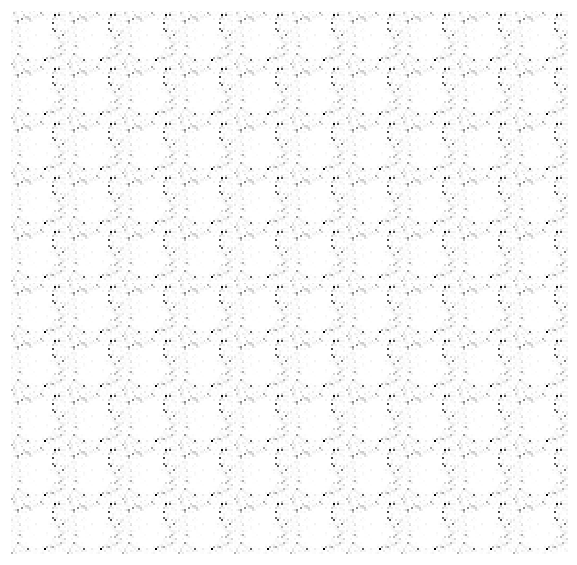

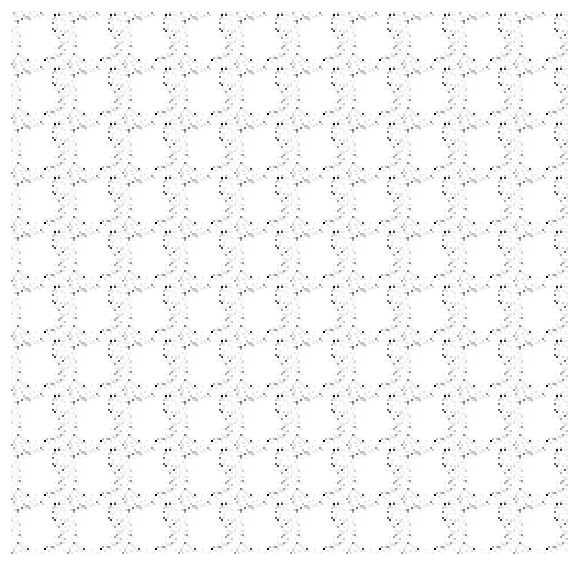

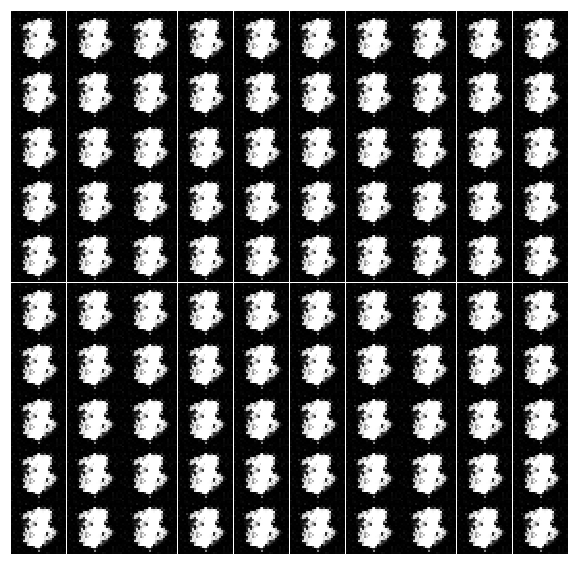

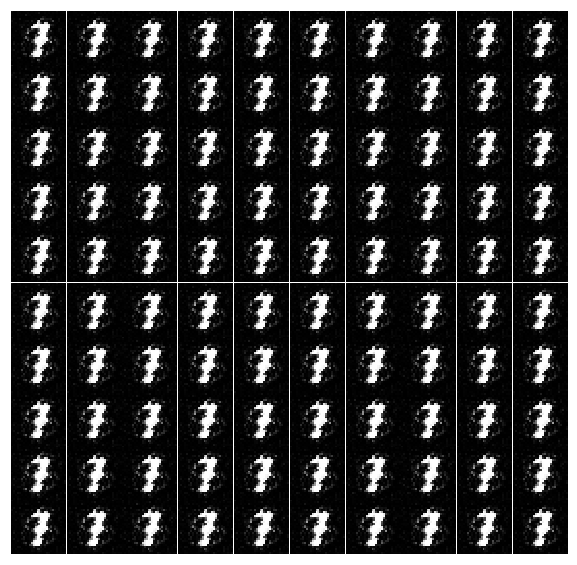

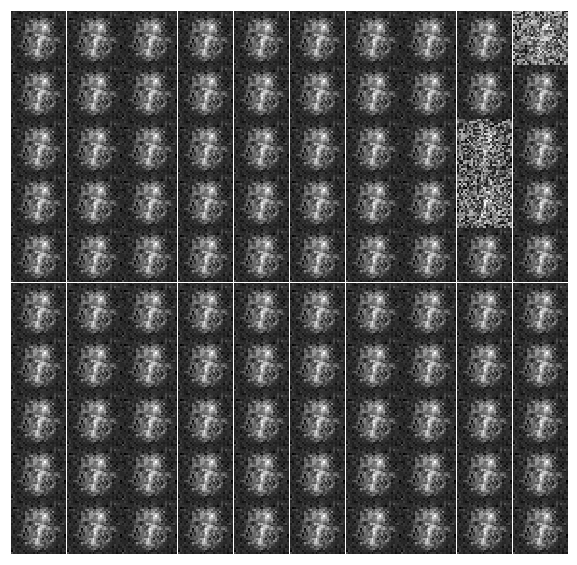

...

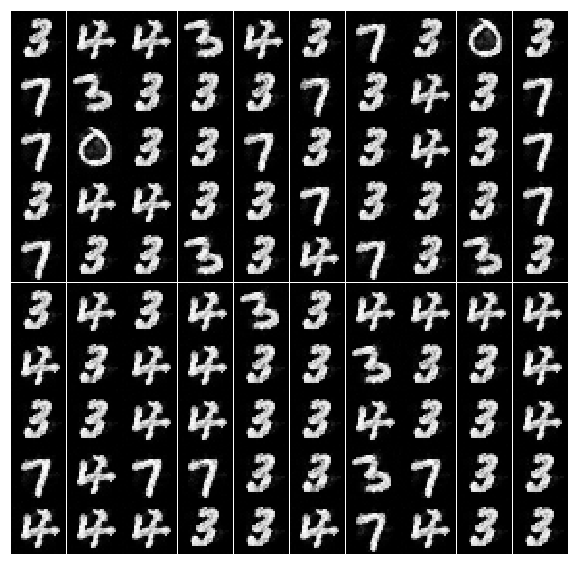

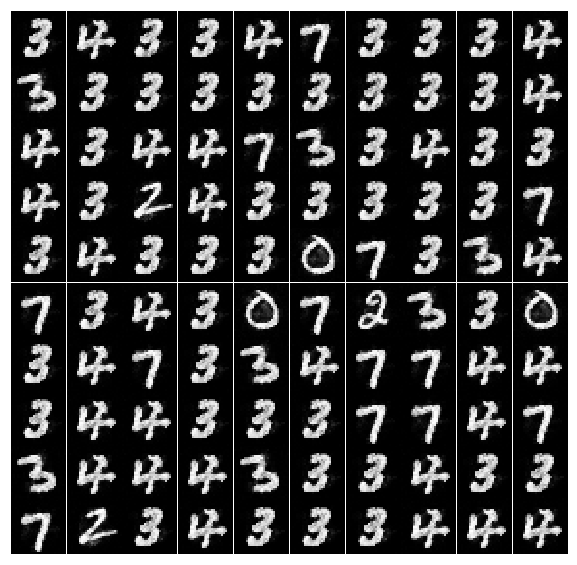

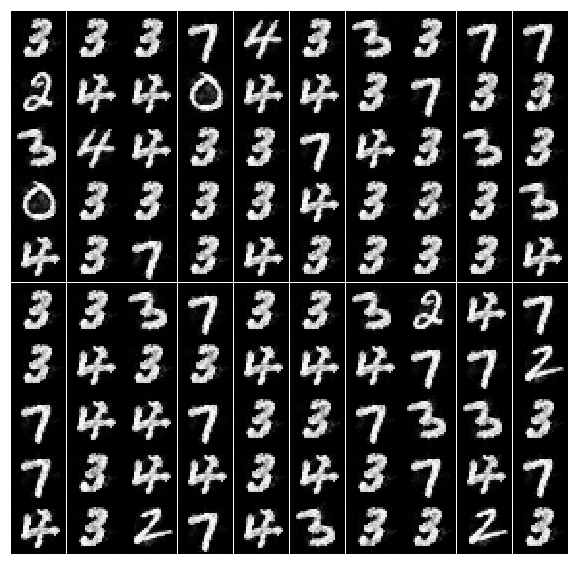

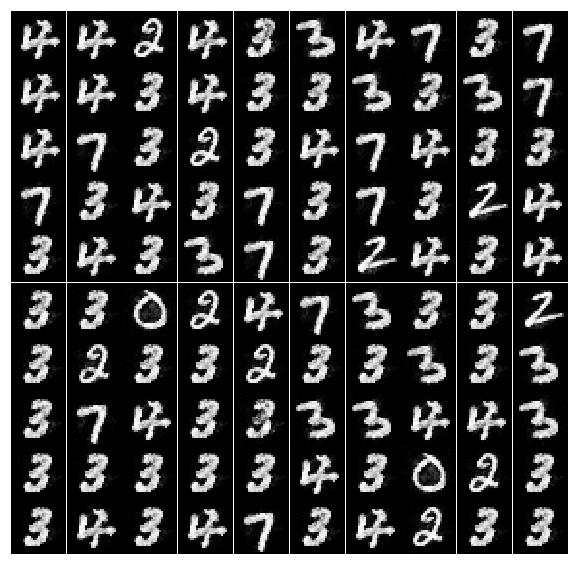

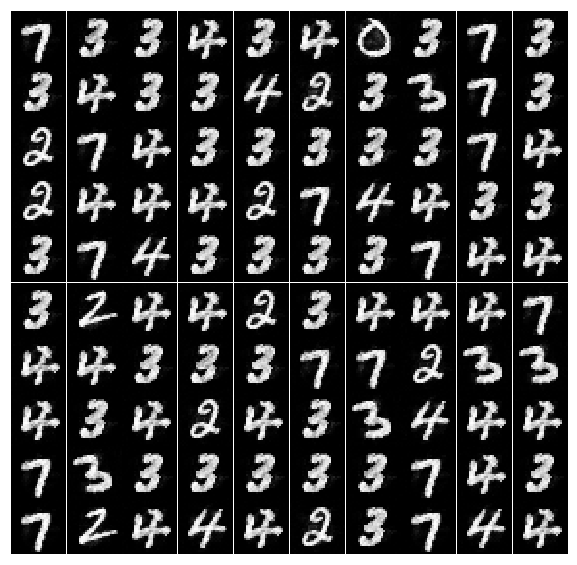

In [ ]:
training_imgaes = mnist.train.next_batch(BATCH_SIZE)[0]
for epoch in range(TRAINING_EPOCHS):
    error = model.train(training_imgaes)
    reshaped_images = np.reshape(model.generate_images(number_of_images=100, n_step=1000, h=test_latent), (-1, 28, 28))
    f, axarr = plt.subplots(10, 10, figsize=(10,10))
    for i in range(10):
        for j in range(10):
            axarr[i, j].imshow(reshaped_images[i*10 + j], cmap='gray')
            axarr[i, j].axis('off')
            axarr[i, j].set_xticklabels([])
            axarr[i, j].set_yticklabels([])
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.savefig('Results/RBM/Simple/{}.png'.format(str(epoch).zfill(3)), bbox_inches='tight')
    plt.show()
print(error)
print('Learning Finished!')